# Test htmlwidgets for R.


Tested with this env file:

```yaml
name: R
channels:
  - conda-forge
  - defaults
dependencies:
  - r-base=3.4.1
  - r-d3heatmap
  - r-diagrammer
  - r-dt
  - r-dygraphs
  - r-highcharter
  - r-irkernel
  - r-leaflet
  - r-networkd3
  - r-plotly
  - r-rbokeh
  - r-threejs
  - r-visnetwork
  - jupyter
  - nb_conda_kernels
```

For more information see http://www.htmlwidgets.org/showcase_leaflet.html

# Leaflet

Works but the size of the frame renders wigdget unusable.

HTML widgets cannot be represented in plain text (need html)
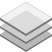
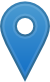

In [1]:
library(leaflet)

m <- leaflet() %>%
  addTiles() %>%  # Add default OpenStreetMap map tiles
  addMarkers(lng=174.768, lat=-36.852, popup="The birthplace of R")
m

# dygraphs

Does not work.

In [2]:
library(dygraphs)
dygraph(nhtemp, main = "New Haven Temperatures") %>% 
  dyRangeSelector(dateWindow = c("1920-01-01", "1960-01-01"))

HTML widgets cannot be represented in plain text (need html)

# plotly

Works out of the box!

In [3]:
library(ggplot2)
library(plotly)
p <- ggplot(data = diamonds, aes(x = cut, fill = clarity)) +
            geom_bar(position = "dodge")
ggplotly(p)


Attaching package: ‘plotly’

The following object is masked from ‘package:ggplot2’:

    last_plot

The following object is masked from ‘package:stats’:

    filter

The following object is masked from ‘package:graphics’:

    layout

We recommend that you use the dev version of ggplot2 with `ggplotly()`
Install it with: `devtools::install_github('hadley/ggplot2')`
Warning message in plyr::split_indices(scale_id, n):
“'.Random.seed' is not an integer vector but of type 'NULL', so ignored”

HTML widgets cannot be represented in plain text (need html)

# rbokeh

Works only if you save the HTML and load it manually.

In [4]:
library(rbokeh)
p <- figure() %>%
  ly_points(Sepal.Length, Sepal.Width, data = iris,
    color = Species, glyph = Species,
    hover = list(Sepal.Length, Sepal.Width))

rbokeh2html(p,'out.html')
IRdisplay::display_html(file='out.html')

Warning message in structure(x, class = unique(c("AsIs", oldClass(x)))):
“Calling 'structure(NULL, *)' is deprecated, as NULL cannot have attributes.
  Consider 'structure(list(), *)' instead.”Warning message in structure(x, class = unique(c("AsIs", oldClass(x)))):
“Calling 'structure(NULL, *)' is deprecated, as NULL cannot have attributes.
  Consider 'structure(list(), *)' instead.”Warning message in structure(x, class = unique(c("AsIs", oldClass(x)))):
“Calling 'structure(NULL, *)' is deprecated, as NULL cannot have attributes.
  Consider 'structure(list(), *)' instead.”Warning message in structure(x, class = unique(c("AsIs", oldClass(x)))):
“Calling 'structure(NULL, *)' is deprecated, as NULL cannot have attributes.
  Consider 'structure(list(), *)' instead.”Warning message in structure(x, class = unique(c("AsIs", oldClass(x)))):
“Calling 'structure(NULL, *)' is deprecated, as NULL cannot have attributes.
  Consider 'structure(list(), *)' instead.”Warning message in structure(x, cla

<!DOCTYPE html>

# highcharter

Works with a minor rendering issue.

In [5]:
library(magrittr)
library(highcharter)
highchart() %>% 
  hc_title(text = "Scatter chart with size and color") %>% 
  hc_add_series_scatter(mtcars$wt, mtcars$mpg,
                        mtcars$drat, mtcars$hp)

Highcharts (www.highcharts.com) is a Highsoft software product which is
not free for commercial and Governmental use
Warning message:
“'hc_add_series_scatter' is deprecated.
Use 'hc_add_series' instead.
See help("Deprecated")”

HTML widgets cannot be represented in plain text (need html)

# visNetwork

Works with a minor rendering issue.

In [6]:
library(visNetwork)
nodes <- data.frame(id = 1:6, title = paste("node", 1:6), 
                    shape = c("dot", "square"),
                    size = 10:15, color = c("blue", "red"))
edges <- data.frame(from = 1:5, to = c(5, 4, 6, 3, 3))
visNetwork(nodes, edges) %>%
  visOptions(highlightNearest = TRUE, nodesIdSelection = TRUE)

HTML widgets cannot be represented in plain text (need html)

# networkD3

Works but the size of the frame renders wigdget unusable.
(Also has the rendering issue.)

In [7]:
library(networkD3)
data(MisLinks, MisNodes)
forceNetwork(Links = MisLinks, Nodes = MisNodes, Source = "source",
             Target = "target", Value = "value", NodeID = "name",
             Group = "group", opacity = 0.4)


Attaching package: ‘networkD3’

The following object is masked from ‘package:highcharter’:

    JS

The following object is masked from ‘package:leaflet’:

    JS



HTML widgets cannot be represented in plain text (need html)

# d3heatmap

Works but the size of the frame renders wigdget unusable.
(Also has the rendering issue.)

In [8]:
library(d3heatmap)
d3heatmap(mtcars, scale="column", colors="Blues")

HTML widgets cannot be represented in plain text (need html)

# DT

Works with a minor rendering issue.

In [9]:
library(DT)
datatable(iris, options = list(pageLength = 5))


Attaching package: ‘DT’

The following object is masked from ‘package:networkD3’:

    JS



HTML widgets cannot be represented in plain text (need html)

# threejs

Works but the size of the frame renders wigdget unusable.

In [10]:
library(threejs)
z <- seq(-10, 10, 0.01)
x <- cos(z)
y <- sin(z)
scatterplot3js(x,y,z, color=rainbow(length(z)))

HTML widgets cannot be represented in plain text (need html)

# rglwidget

Not available in conda :-(

```R
library(rgl)
library(rglwidget)
library(htmltools)

theta <- seq(0, 6*pi, len=100)
xyz <- cbind(sin(theta), cos(theta), theta)
lineid <- plot3d(xyz, type="l", alpha = 1:0, 
                 lwd = 5, col = "blue")["data"]

browsable(tagList(
  rglwidget(elementId = "example", width = 500, height = 400,
            controllers = "player"),
  playwidget("example", 
             ageControl(births = theta, ages = c(0, 0, 1),
                        objids = lineid, alpha = c(0, 1, 0)),
                        start = 1, stop = 6*pi, step = 0.1, 
                        rate = 6,elementId = "player")
))
```

# DiagrammeR

Works with a minor rendering issue.

In [11]:
library(DiagrammeR)
grViz("
  digraph {
    layout = twopi
    node [shape = circle]
    A -> {B C D} 
  }")

Warning message:
“replacing previous import ‘scales::viridis_pal’ by ‘viridis::viridis_pal’ when loading ‘DiagrammeR’”

HTML widgets cannot be represented in plain text (need html)

# metricsgraphics

Not available in conda :-(

```R
library(metricsgraphics)
mjs_plot(mtcars, x=wt, y=mpg) %>%
  mjs_point(color_accessor=carb, size_accessor=carb) %>%
  mjs_labs(x="Weight of Car", y="Miles per Gallon")
```